In [1]:
import os
os.getcwd()

'C:\\Users\\sony'

In [2]:
os.chdir("C:\\Users\\sony\\Desktop")

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import statsmodels.api as sm
import scipy.stats as st
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split

In [4]:
df= pd.read_csv('Ionosphere.csv')

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 351 entries, 0 to 350
Data columns (total 35 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   V1      351 non-null    int64  
 1   V2      351 non-null    int64  
 2   V3      351 non-null    float64
 3   V4      351 non-null    float64
 4   V5      351 non-null    float64
 5   V6      351 non-null    float64
 6   V7      351 non-null    float64
 7   V8      351 non-null    float64
 8   V9      351 non-null    float64
 9   V10     351 non-null    float64
 10  V11     351 non-null    float64
 11  V12     351 non-null    float64
 12  V13     351 non-null    float64
 13  V14     351 non-null    float64
 14  V15     351 non-null    float64
 15  V16     351 non-null    float64
 16  V17     351 non-null    float64
 17  V18     351 non-null    float64
 18  V19     351 non-null    float64
 19  V20     351 non-null    float64
 20  V21     351 non-null    float64
 21  V22     351 non-null    float64
 22  V2

In [6]:
df.describe()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V26,V27,V28,V29,V30,V31,V32,V33,V34,Class
count,351.000000,351.0,351.000000,351.000000,351.000000,351.000000,351.000000,351.000000,351.000000,351.000000,...,351.000000,351.000000,351.000000,351.000000,351.000000,351.000000,351.000000,351.000000,351.000000,351.000000
mean,0.891738,0.0,0.641342,0.044372,0.601068,0.115889,0.550095,0.119360,0.511848,0.181345,...,-0.071187,0.541641,-0.069538,0.378445,-0.027907,0.352514,-0.003794,0.349364,0.014480,0.641026
std,0.311155,0.0,0.497708,0.441435,0.519862,0.460810,0.492654,0.520750,0.507066,0.483851,...,0.508495,0.516205,0.550025,0.575886,0.507974,0.571483,0.513574,0.522663,0.468337,0.480384
min,0.000000,0.0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.000000
25%,1.000000,0.0,0.472135,-0.064735,0.412660,-0.024795,0.211310,-0.054840,0.087110,-0.048075,...,-0.332390,0.286435,-0.443165,0.000000,-0.236885,0.000000,-0.242595,0.000000,-0.165350,0.000000
50%,1.000000,0.0,0.871110,0.016310,0.809200,0.022800,0.728730,0.014710,0.684210,0.018290,...,-0.015050,0.708240,-0.017690,0.496640,0.000000,0.442770,0.000000,0.409560,0.000000,1.000000
75%,1.000000,0.0,1.000000,0.194185,1.000000,0.334655,0.969240,0.445675,0.953240,0.534195,...,0.156765,0.999945,0.153535,0.883465,0.154075,0.857620,0.200120,0.813765,0.171660,1.000000
max,1.000000,0.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


# In target variable the values are distinct and binary. Therefore it is a binary classification problem.

In [7]:
df['V1']=df['V1'].astype('category')

In [10]:
df=df.drop(["V2"],axis=1)

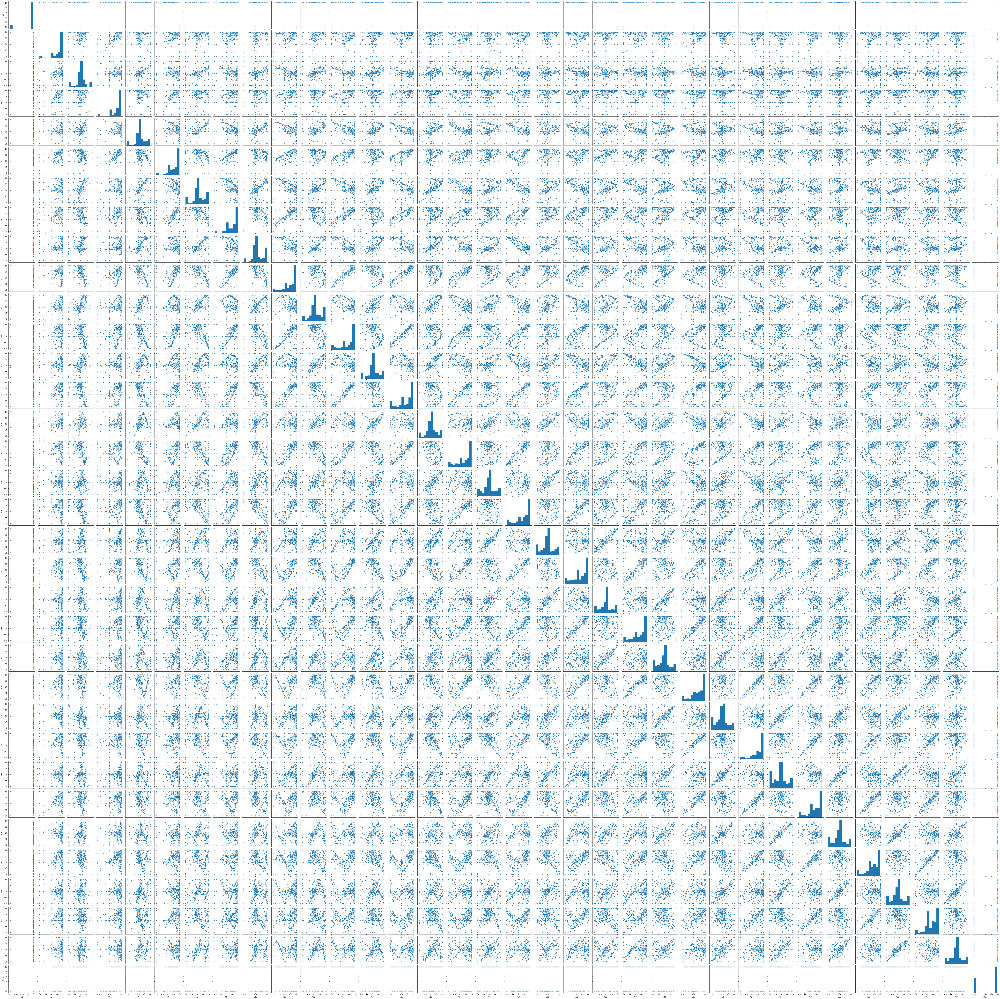

In [11]:
# Plot a pair plot
sns.pairplot(df)
plt.show()

Text(0.5, 1, 'Correlation Heatmap')

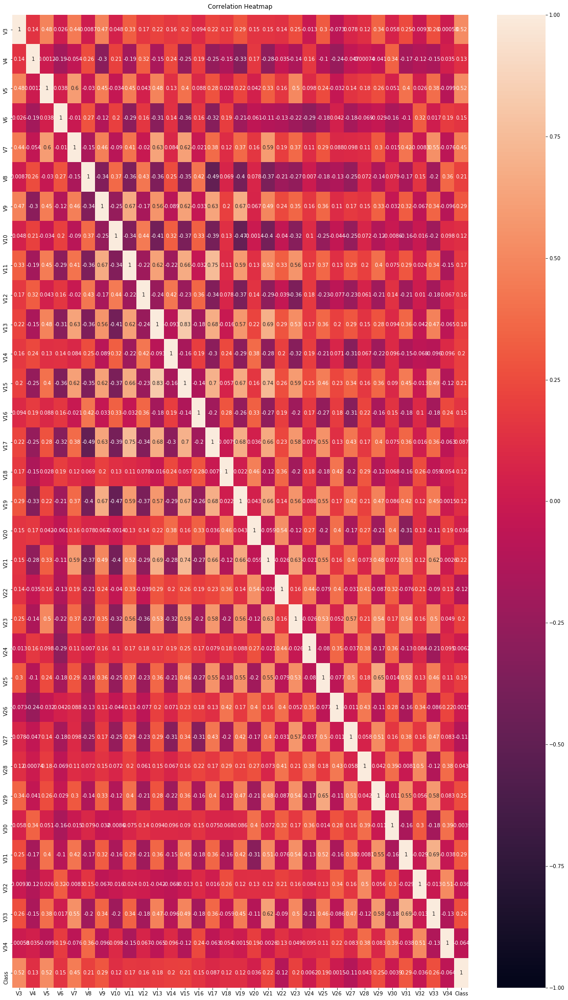

In [12]:
df.corr()
plt.figure(figsize=(20, 35))
heatmap = sns.heatmap(df.corr(), vmin=-1, vmax=1, annot=True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)

In [13]:
#Putting feature variable to X
X=df.drop('Class',axis=1)

#Putting response variable to y
y=df['Class']

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.30,random_state=99)

X_train.head()

,V1,V3,V4,V5,V6,V7,V8,V9,V10,V11,...,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34
196,1,1.00000,-1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,-0.50000,1.00000,...,1.00000,1.00000,1.00000,0.62500,1.00000,-0.75000,-0.75000,1.00000,1.00000,1.00000
329,1,0.88110,0.00000,0.94817,-0.02744,0.93598,-0.01220,0.90244,0.01829,0.90244,...,0.99695,0.04878,0.89666,0.02226,0.90854,0.00915,1.00000,0.05488,0.97561,-0.01220
177,1,0.91667,0.29167,0.83333,-0.16667,0.70833,0.25000,0.87500,-0.08333,0.91667,...,0.83333,-0.12500,0.83796,0.05503,1.00000,0.20833,0.70833,0.00000,0.70833,0.04167
162,1,1.00000,-1.00000,1.00000,1.00000,-1.00000,1.00000,1.00000,-1.00000,1.00000,...,1.00000,-1.00000,1.00000,1.00000,1.00000,1.00000,-1.00000,1.00000,-1.00000,1.00000
231,1,0.94649,0.00892,0.97287,-0.00260,0.98922,0.00372,0.95801,0.01598,0.94054,...,0.93274,0.08101,0.95243,0.04356,0.97473,0.00818,0.97845,0.07061,1.00000,-0.00260


In [14]:
#Import descision tree classifier from sk learn library
from sklearn.tree import DecisionTreeClassifier

#Fitting the decession tree with default hyperparameters,apart from 
#max_depth which is 5 so that we can plot and read the tree

dt_default=DecisionTreeClassifier(max_depth=5)
dt_default.fit(X_train,y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=5, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [15]:
#lets check the evaluation metrics of our default model

#Importing classification report and confusion matrix from sklearn metrics

from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

#Making predictions
y_pred_default=dt_default.predict(X_test)

#Printing classification report
print(classification_report(y_test,y_pred_default))

              precision    recall  f1-score   support

           0       0.90      0.72      0.80        36
           1       0.87      0.96      0.91        70

    accuracy                           0.88       106
   macro avg       0.88      0.84      0.86       106
weighted avg       0.88      0.88      0.87       106



In [16]:
print(confusion_matrix(y_test,y_pred_default))
# print(accuracy_score(y_test,y_pred_default))

[[26 10]
 [ 3 67]]


In [17]:
print(accuracy_score(y_test,dt_default.predict(X_test)))

0.8773584905660378


In [18]:
#GridSearchCV to find optimal max_depth
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV

#specify number of folds for k-fold CV
n_folds = 5

#parameters to build model on
parameters={'max_depth':range(4,21)}

#instantiate the model
dtree = DecisionTreeClassifier(criterion='gini', random_state=100)

#fit tree on the training data
tree=GridSearchCV(dtree, parameters, cv=n_folds, scoring='accuracy')

tree.fit(X_train,y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=100,
                                              splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'max_depth': range(4, 21)}, pre_dispatch='2*n_jobs',
 

In [19]:
tree.best_params_

{'max_depth': 4}

In [20]:
#scores of GridSearch CV
scores=tree.cv_results_
pd.DataFrame(scores).head(20)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.011391,0.003381,0.004398,0.003824,4,{'max_depth': 4},0.897959,0.836735,0.877551,0.857143,0.938776,0.881633,0.035112,1
1,0.008395,0.001497,0.002998,0.002097,5,{'max_depth': 5},0.897959,0.877551,0.877551,0.836735,0.877551,0.873469,0.019996,2
2,0.008395,0.002153,0.001799,0.000400,6,{'max_depth': 6},0.877551,0.816327,0.897959,0.816327,0.857143,0.853061,0.032653,17
3,0.014592,0.006970,0.003997,0.002098,7,{'max_depth': 7},0.897959,0.836735,0.897959,0.795918,0.857143,0.857143,0.038722,16
4,0.022586,0.007306,0.005397,0.002244,8,{'max_depth': 8},0.897959,0.857143,0.897959,0.816327,0.857143,0.865306,0.030544,4
5,0.008395,0.001498,0.001998,0.000630,9,{'max_depth': 9},0.897959,0.857143,0.897959,0.795918,0.857143,0.861224,0.037409,5
6,0.007995,0.000632,0.001800,0.000401,10,{'max_depth': 10},0.897959,0.857143,0.897959,0.836735,0.857143,0.869388,0.024490,3
7,0.007994,0.000894,0.001799,0.000748,11,{'max_depth': 11},0.897959,0.857143,0.897959,0.795918,0.857143,0.861224,0.037409,5
8,0.008194,0.001468,0.001599,0.000490,12,{'max_depth': 12},0.897959,0.857143,0.897959,0.795918,0.857143,0.861224,0.037409,5
9,0.008794,0.001467,0.002198,0.000748,13,{'max_depth': 13},0.897959,0.857143,0.897959,0.795918,0.857143,0.861224,0.037409,5


In [21]:
from sklearn.ensemble import RandomForestClassifier
rf_default=RandomForestClassifier()

In [22]:
rf_default.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [23]:
RandomForestClassifier()

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [24]:
print(confusion_matrix(y_test,rf_default.predict(X_test)))

[[33  3]
 [ 0 70]]


In [25]:
print(accuracy_score(y_test,rf_default.predict(X_test)))

0.9716981132075472
